# Beverage Product Detection with YOLO26s

An end-to-end object detection pipeline that trains a **YOLO26s** model to detect and classify 5 beverage products in images and video using the [Ultralytics](https://github.com/ultralytics/ultralytics) library.

---

## Detected Classes

| ID | Class |
|----|-------|
| 0  | AikCheong_CoffeeMix |
| 1  | Boh_InstantTeh |
| 2  | FrencheRoast_SaltedCaramel |
| 3  | Nestum_Honey |
| 4  | Oreo_Original |

---

## Pipeline Overview

| Step | Description |
|------|-------------|
| 1. Dataset Preparation | Mount Google Drive and copy the pre-split dataset to session storage |
| 2. Model Training | Install dependencies, configure MLflow, and train YOLO26s for 50 epochs |
| 3. Validation | Run inference and evaluate metrics on the validation set |
| 4. Testing | Evaluate performance on the held-out test set |
| 5. Video Inference | Run the trained model on a recorded video |

> **Requirements:** Enable GPU before running — *Runtime → Change runtime type → T4 GPU*

## 2. Dataset Preparation

Mount Google Drive to access the dataset, define all path variables, then copy the train/validation/test folders into Colab session storage for faster I/O during training.

In [1]:
!nvidia-smi

Mon Jun 22 07:18:42 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   45C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
import os

# Paths to dataset partitions on Google Drive
dataset_uri  = '/content/drive/MyDrive/Projects/computer_vision/drinks-detection-with-yolo/dataset'
trainset_uri = '/content/drive/MyDrive/Projects/computer_vision/drinks-detection-with-yolo/dataset/train'
valset_uri   = '/content/drive/MyDrive/Projects/computer_vision/drinks-detection-with-yolo/dataset/validation'
testset_uri  = '/content/drive/MyDrive/Projects/computer_vision/drinks-detection-with-yolo/dataset/test'

# Local session storage path (faster disk I/O than Drive)
base_dataset_path = '/content/data'

train_data_uri = os.path.join(base_dataset_path, 'train')
val_data_uri   = os.path.join(base_dataset_path, 'validation')
test_data_uri  = os.path.join(base_dataset_path, 'test')

> **Note — ZIP dataset:** If your dataset is stored as a `.zip` file on Drive, uncomment and run the line below before proceeding. If not, skip to the next cell

In [ ]:
# !unzip -q /content/drive/MyDrive/.../data_v1.zip -d /content/drive/MyDrive/.../data_v1

In [6]:
# Copy dataset from Google Drive into session storage.
# This takes a few minutes but speeds up training significantly.
!mkdir /content/data

!cp -r {trainset_uri}  /content/data/train
!cp -r {valset_uri}    /content/data/validation
!cp -r {testset_uri}   /content/data/test

mkdir: cannot create directory ‘/content/data’: File exists


## 3. Model Training

Steps in this section:
1. Install required libraries and import dependencies
2. Auto-generate the `data.yaml` config file from `classes.txt`
3. Configure MLflow experiment tracking
4. Train YOLO26s on the dataset

In [7]:
!pip install ultralytics mlflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.7/49.7 kB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.5/50.5 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.7/43.7 kB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 47.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.6/12.6 MB 85.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.5/3.5 MB 77.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 52.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.8/147.8 kB 9.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.9/114.9 kB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.0/212.0 kB 17.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.9/94.9 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.2/1

In [8]:
import mlflow       #experiment tracking
import ultralytics
from pathlib import Path
from ultralytics import YOLO
import yaml

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd


ultralytics.checks()

Ultralytics 8.4.75 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 47.4/112.6 GB disk)


In [9]:
def create_data_yaml(path_to_classes_txt, path_to_data_yaml, dataset_base_path):
    """Reads classes.txt and writes a YOLO-compatible data.yaml config file."""
    if not os.path.exists(path_to_classes_txt):
        print(f'classes.txt not found at {path_to_classes_txt}')
        return

    with open(path_to_classes_txt, 'r') as f:
        classes = [line.strip() for line in f if line.strip()]

    data = {
        'path': dataset_base_path,
        'train': 'train/images',
        'val': 'validation/images',
        'test': 'test/images',
        'nc': len(classes),
        'names': classes
    }

    os.makedirs(os.path.dirname(path_to_data_yaml), exist_ok=True)
    with open(path_to_data_yaml, 'w') as f:
        yaml.dump(data, f, sort_keys=False)

    print(f'data.yaml created at {path_to_data_yaml}')


path_to_classes_txt = os.path.join(dataset_uri, 'classes.txt')
path_to_data_yaml   = os.path.join(base_dataset_path, 'data.yaml')

create_data_yaml(path_to_classes_txt, path_to_data_yaml, base_dataset_path)

print('\nFile contents:\n')
!cat {path_to_data_yaml}

data.yaml created at /content/data/data.yaml

File contents:

path: /content/data
train: train/images
val: validation/images
test: test/images
nc: 5
names:
- AikCheong_CoffeeMix
- Boh_InstantTeh
- FrencheRoast_SaltedCaramel
- Nestum_Honey
- Oreo_Original


In [10]:
# Training hyperparameters — adjust as needed
SEED  = 42   # fixed seed for reproducibility
EPOCH = 50

In [11]:
os.environ["MLFLOW_ALLOW_FILE_STORE"] = "true"

mlflow_uri      = "/content/drive/MyDrive/Projects/computer_vision/drinks-detection-with-yolo/training_log"
experiment_name = "beverage-detection-yolo26s"

mlflow.set_tracking_uri(mlflow_uri)
mlflow.set_experiment(experiment_name)

2026/06/22 07:24:57 INFO mlflow.tracking.fluent: Experiment with name 'beverage-detection-yolo26s' does not exist. Creating a new experiment.


<Experiment: artifact_location='/content/drive/MyDrive/Projects/computer_vision/drinks-detection-with-yolo/training_log/632477478435044723', creation_time=1782113097220, effective_trace_archival_retention=None, experiment_id='632477478435044723', last_update_time=1782113097220, lifecycle_stage='active', name='beverage-detection-yolo26s', tags={}, trace_location=None, workspace='default'>

### Load & Train Model

Load the YOLO26s pre-trained weights. The weights file will be downloaded automatically on first run (~19 MB).

In [12]:
model = YOLO("yolo26s.pt")

In [14]:
results = model.train(
    data        = "/content/data/data.yaml",
    epochs      = EPOCH,
    batch       = 16,
    imgsz       = 640,
    save_period = 10,
    verbose     = True,
    seed        = SEED,
)

print("Training complete.")

Ultralytics 8.4.75 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/data/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo26s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, persp

2026/06/22 07:27:26 INFO mlflow.tracking.fluent: Autologging successfully enabled for statsmodels.
2026/06/22 07:27:26 WARNING mlflow.spark: With Pyspark >= 3.2, PYSPARK_PIN_THREAD environment variable must be set to false for Spark datasource autologging to work.
2026/06/22 07:27:26 INFO mlflow.tracking.fluent: Autologging successfully enabled for pyspark.


MLflow: logging run_id(6dc4e49bea1943d9af5a46648ccd35b2) to /content/drive/MyDrive/Projects/computer_vision/drinks-detection-with-yolo/training_log
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri /content/drive/MyDrive/Projects/computer_vision/drinks-detection-with-yolo/training_log'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       1/50      4.76G     0.7901      4.397   0.003719        121        640: 100% ━━━━━━━━━━━━ 20/20 1.6s/it 31.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 4.5s/it 4.5s
                   all         26        162      0.233       0.49       0.28      0.249

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       

## 4. Validation

Evaluate the trained model on the validation set. This section runs inference, displays a sample of predicted images, and reports precision, recall, and mAP metrics.

### Run Predictions on Validation Set

Run the best checkpoint on all validation images and save the results with bounding boxes drawn.

In [15]:
# Run prediction on Validation Set
!yolo detect predict model=runs/detect/train/weights/best.pt source=data/validation/images save=True name=predict_validation

Ultralytics 8.4.75 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO26s summary (fused): 122 layers, 9,467,115 parameters, 0 gradients, 20.5 GFLOPs

image 1/26 /content/data/validation/images/02183f91-WhatsApp_Image_2026-06-01_at_07.47.13__rotate_90.jpeg: 640x480 1 AikCheong_CoffeeMix, 1 Boh_InstantTeh, 1 FrencheRoast_SaltedCaramel, 1 Nestum_Honey, 1 Oreo_Original, 56.1ms
image 2/26 /content/data/validation/images/05973f41-WhatsApp_Image_2026-06-01_at_07.47.13_1__rotate_90.jpeg: 640x480 2 AikCheong_CoffeeMixs, 1 Boh_InstantTeh, 1 FrencheRoast_SaltedCaramel, 1 Nestum_Honey, 1 Oreo_Original, 13.4ms
image 3/26 /content/data/validation/images/067ea140-WhatsApp_Image_2026-06-01_at_07.46.58.jpeg: 480x640 2 AikCheong_CoffeeMixs, 2 Boh_InstantTehs, 1 FrencheRoast_SaltedCaramel, 2 Nestum_Honeys, 1 Oreo_Original, 60.6ms
image 4/26 /content/data/validation/images/0da7c1d4-WhatsApp_Image_2026-06-01_at_07.46.58_1__flip_h_bright.jpeg: 480x640 2 AikCheong_CoffeeMixs, 2 Boh_InstantT

Sample predictions from the validation set:


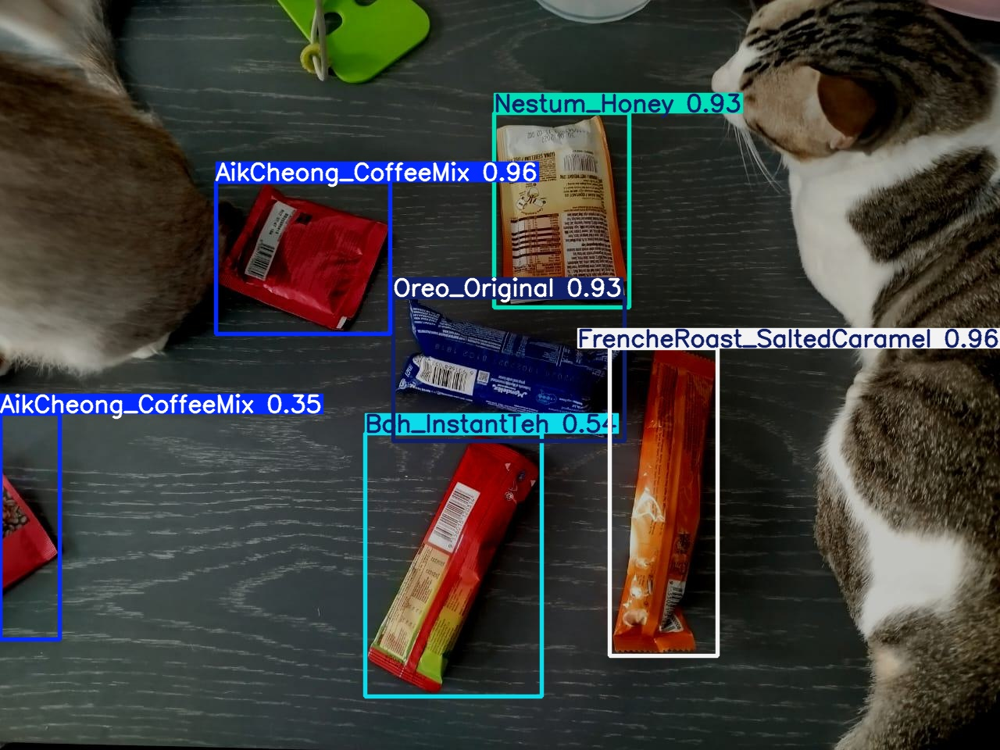

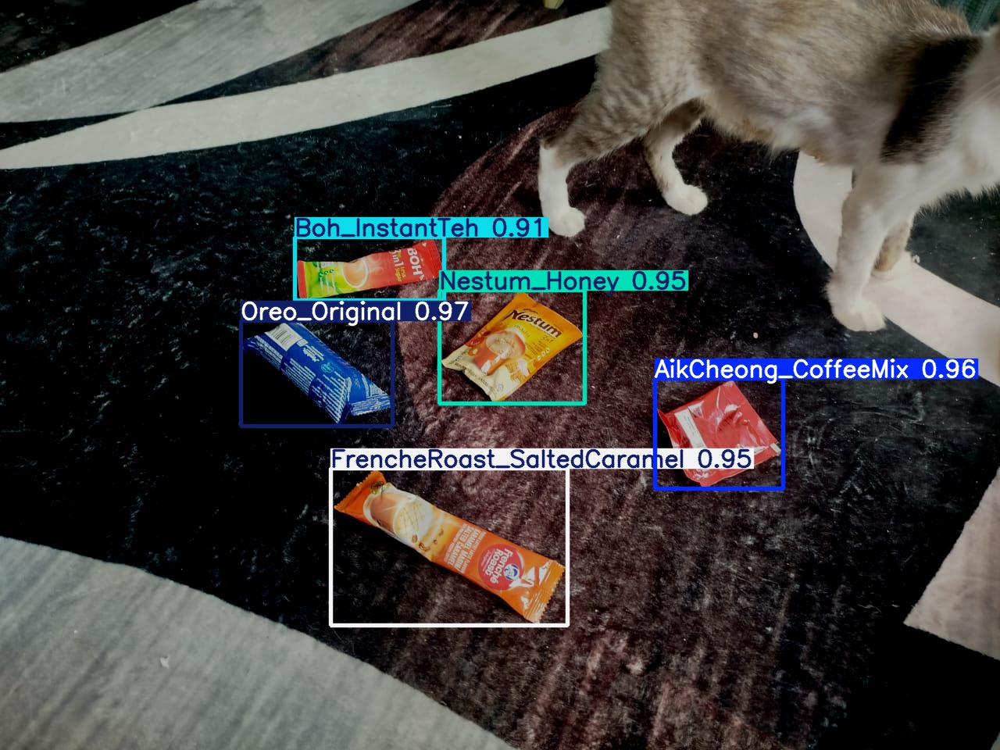

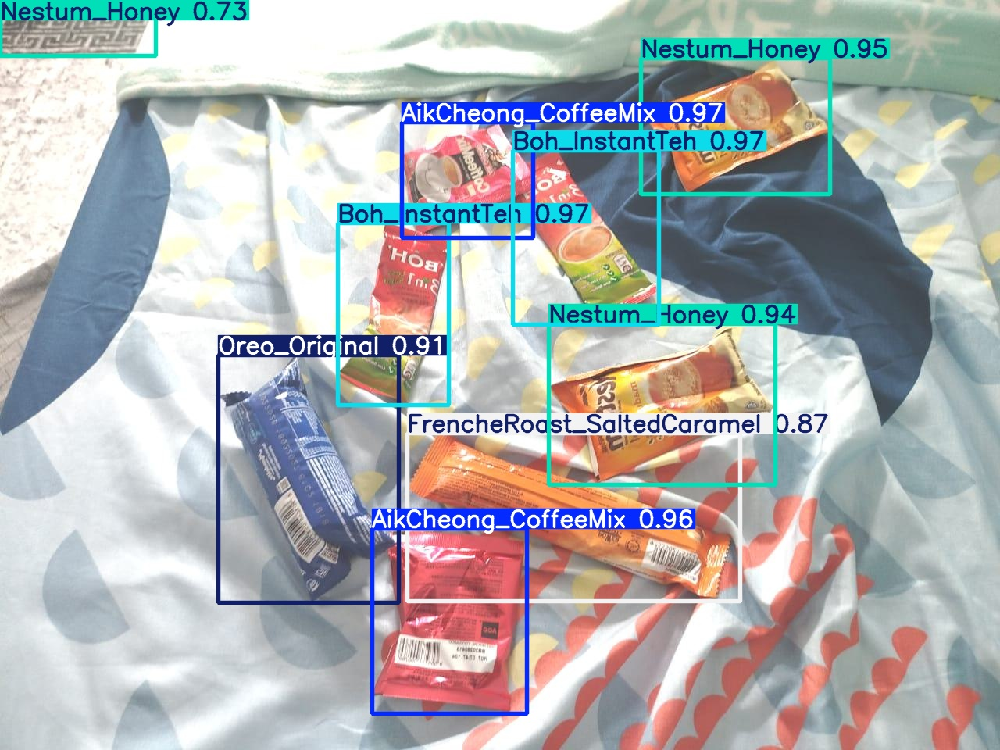

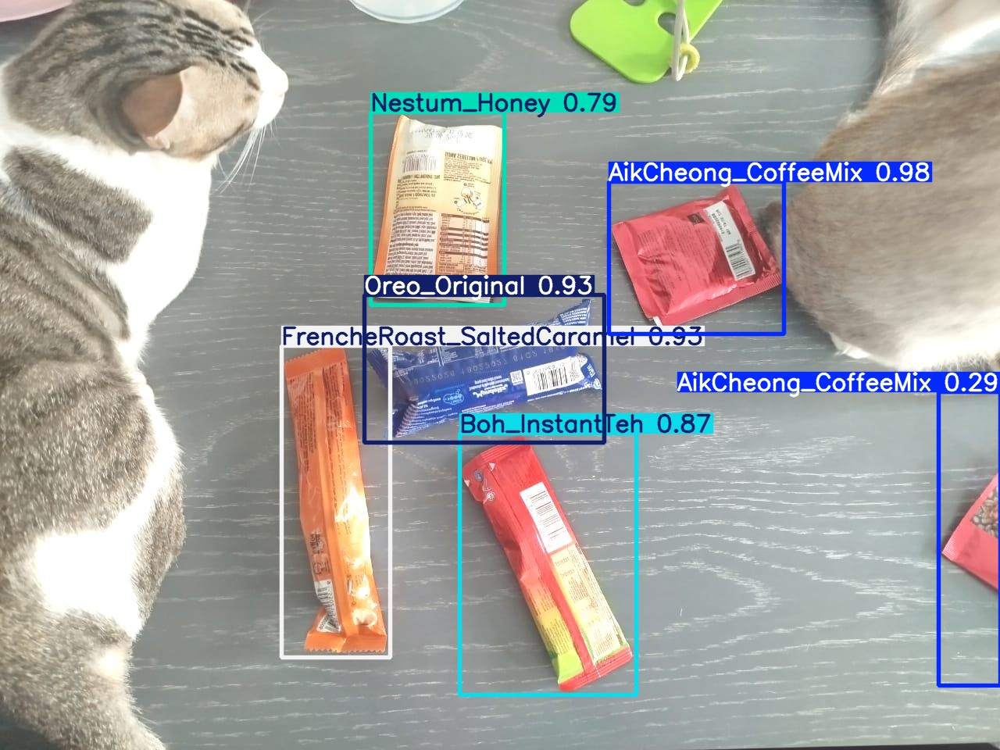

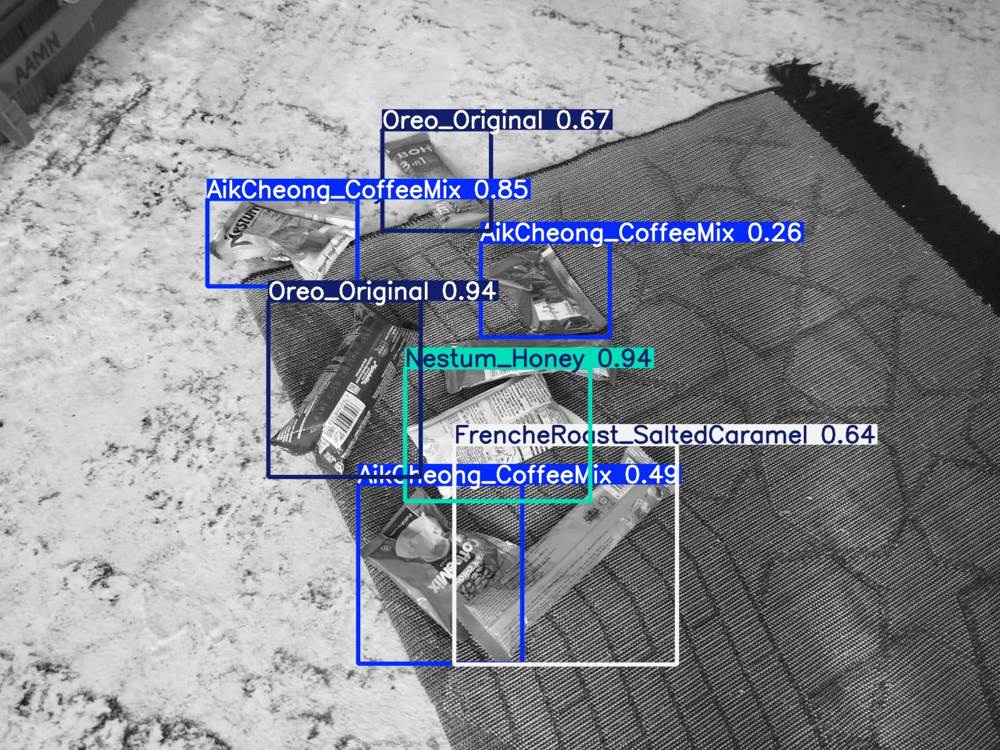

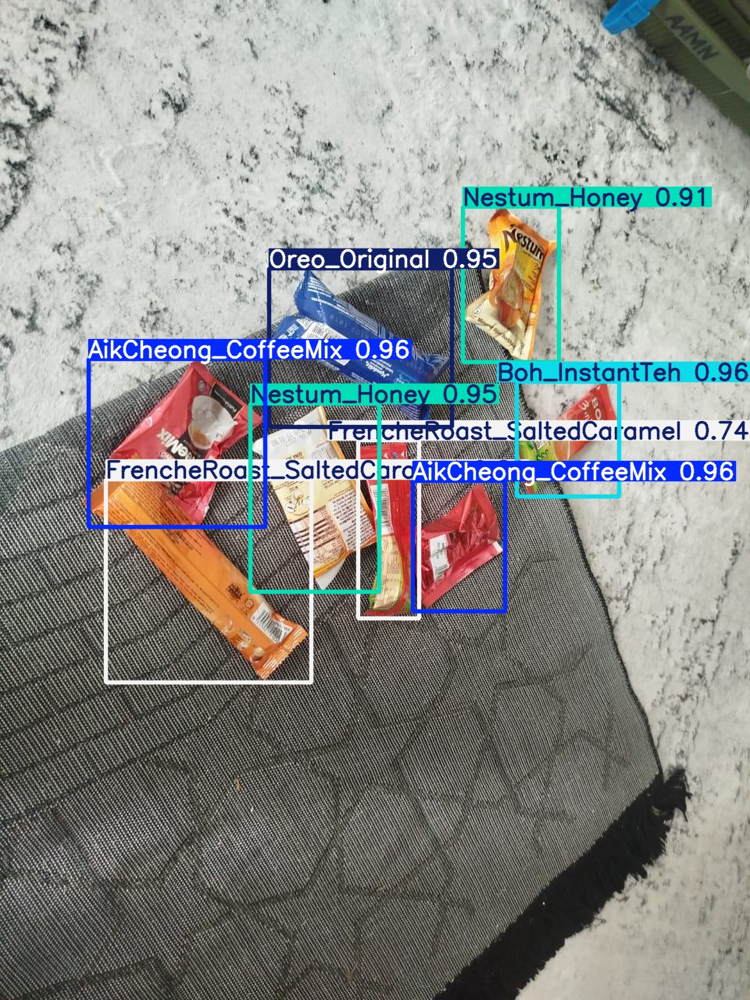

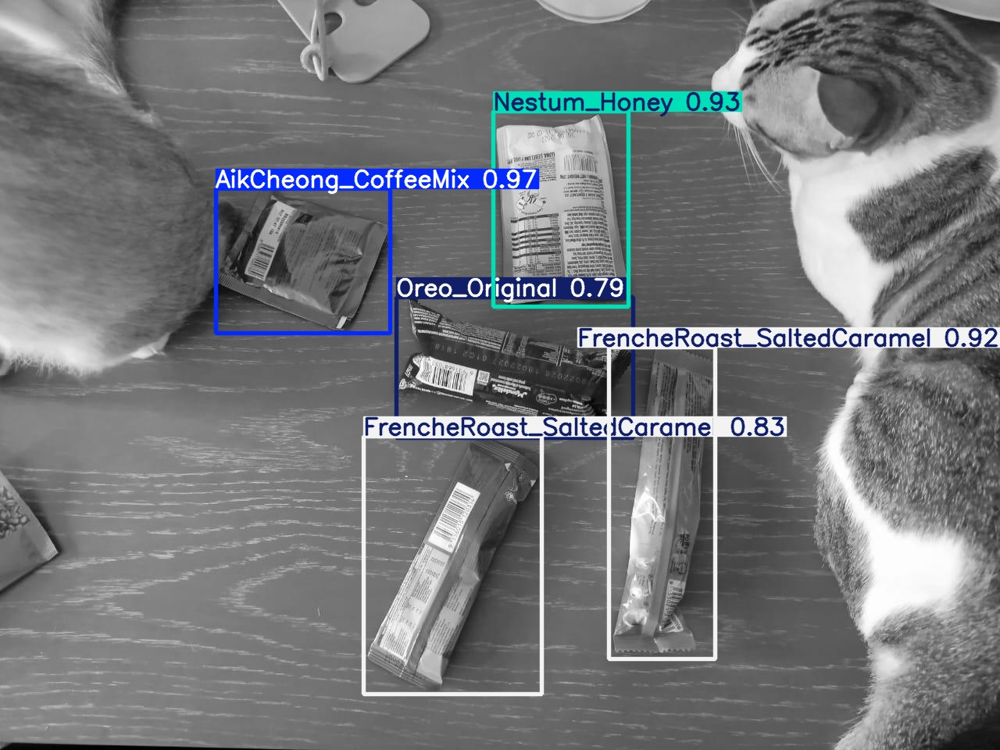

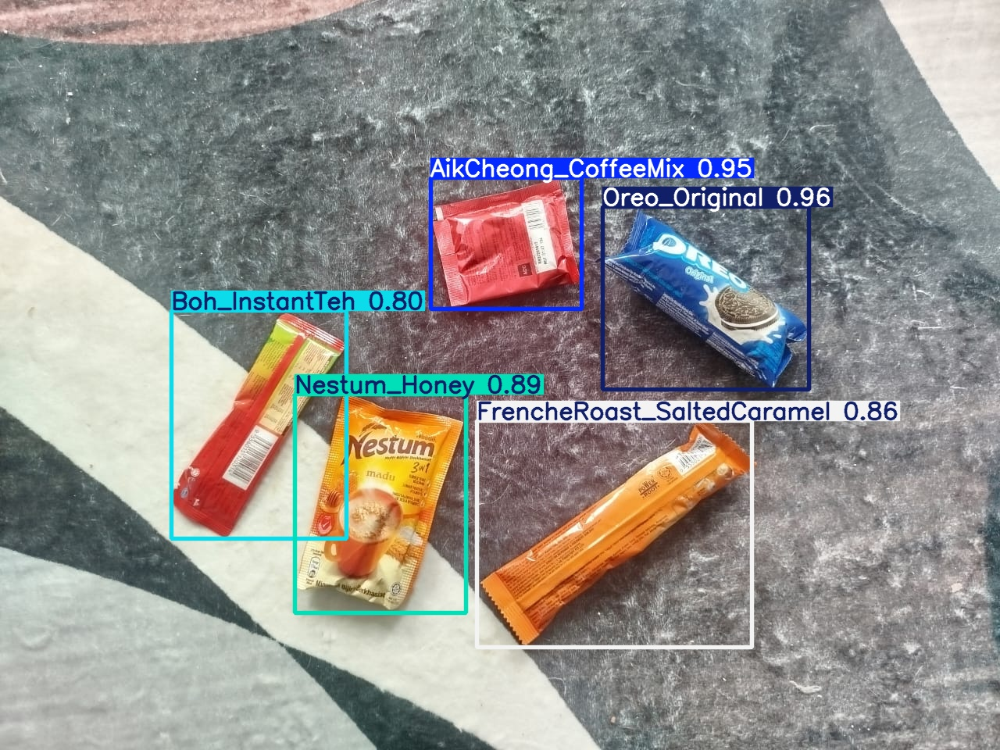

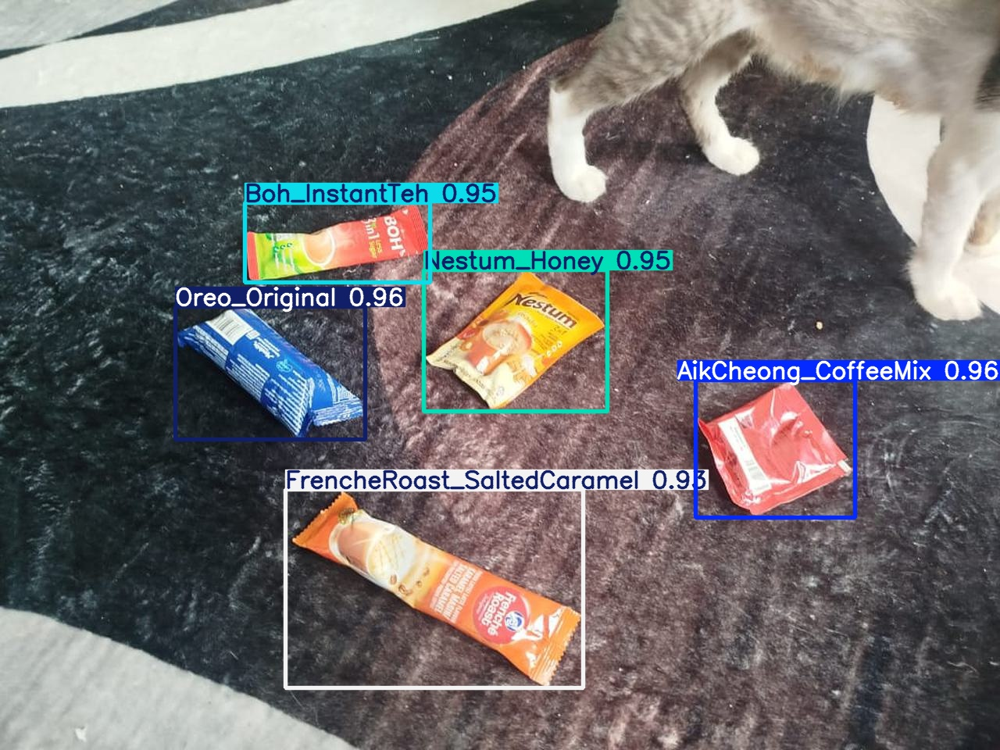

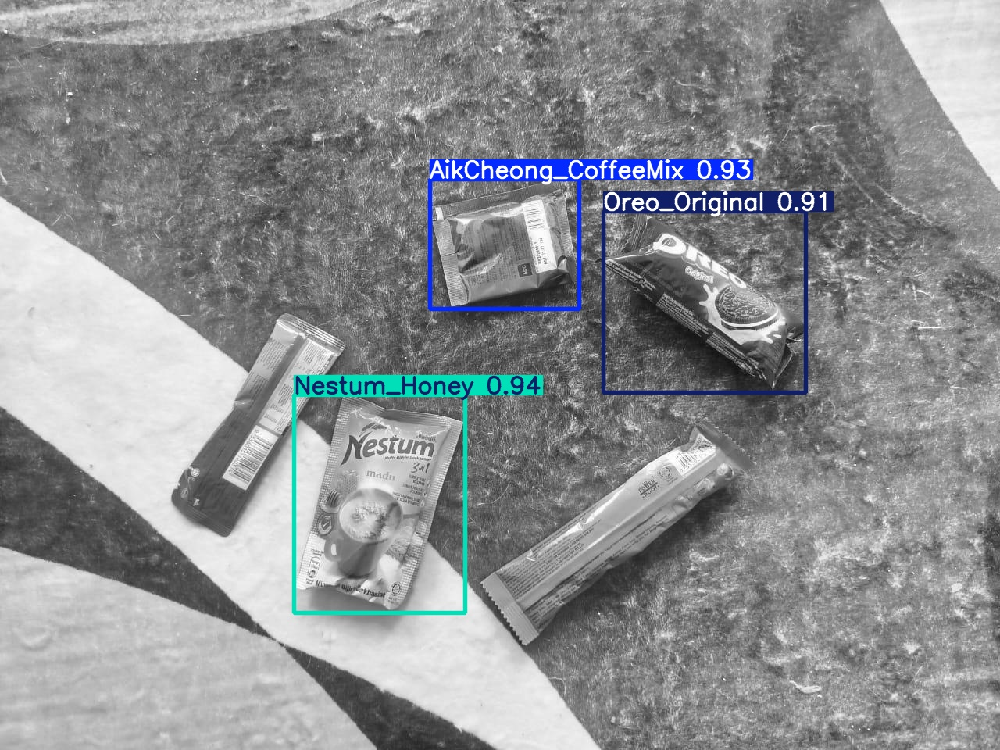

In [16]:
import glob
from IPython.display import Image, display

print("Sample predictions from the validation set:")
for image_path in glob.glob(f'/content/runs/detect/predict_validation/*.jpg')[:10]:
  display(Image(filename=image_path, height=400))
  print('\n')

### Evaluate Model Performance on Validation Set

Now, let's evaluate the trained model's performance on the validation dataset. This will provide metrics such as precision, recall, and mean average precision (mAP).

In [18]:
# Evaluate the model on the validation dataset using the data.yaml config
metrics_val = model.val(data="/content/data/data.yaml", split="val")

# Print the metrics
print(f"\nPrecision: {metrics_val.box.p}")
print(f"Recall: {metrics_val.box.r}")
print(f"mAP50: {metrics_val.box.map50}")
print(f"mAP50-95: {metrics_val.box.map}")

Ultralytics 8.4.75 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1219.5±298.3 MB/s, size: 176.6 KB)
val: Scanning /content/data/validation/labels.cache... 26 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 26/26 7.8Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 1.3it/s 1.6s
                   all         26        162      0.935      0.928      0.966      0.897
   AikCheong_CoffeeMix         26         40      0.944      0.847      0.969       0.85
        Boh_InstantTeh         26         35          1      0.868      0.942      0.888
FrencheRoast_SaltedCaramel         26         26      0.841      0.923      0.932      0.851
          Nestum_Honey         26         35      0.946          1      0.994      0.933
         Oreo_Original         26         26      0.942          1      0.995      0.961
Speed: 11.4ms preprocess, 10.8ms infere

/tmp/ipykernel_2219/4109520265.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Metric', y='Value', data=df_metrics, palette='viridis', ax=ax)


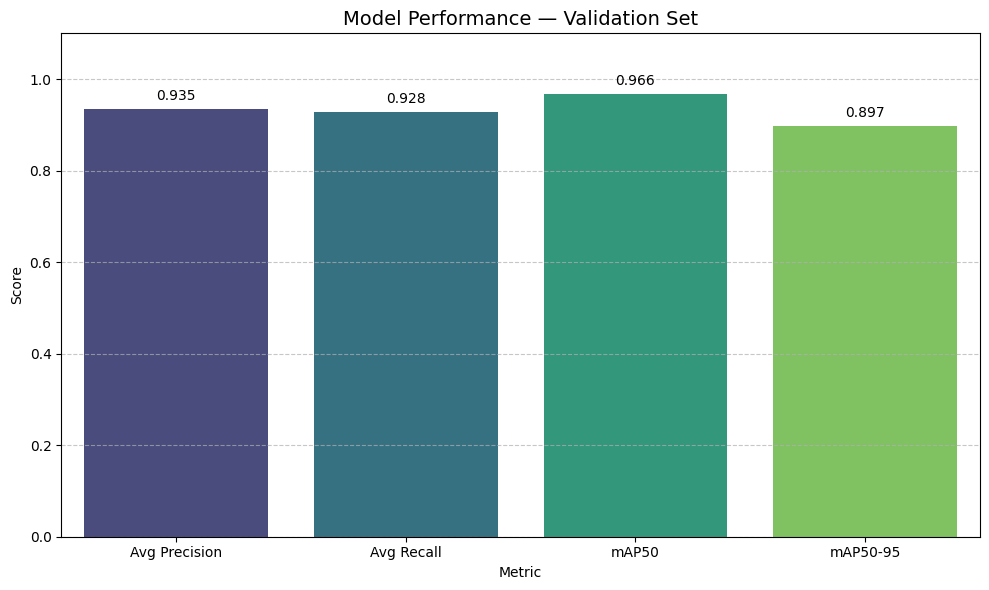

In [19]:
# Plot box chart

avg_precision = metrics_val.box.p.mean()
avg_recall    = metrics_val.box.r.mean()

metrics_data = {
    'Metric': ['Avg Precision', 'Avg Recall', 'mAP50', 'mAP50-95'],
    'Value':  [avg_precision, avg_recall, metrics_val.box.map50, metrics_val.box.map],
}
df_metrics = pd.DataFrame(metrics_data)

fig, ax = plt.subplots(figsize=(10, 6))
sns.barplot(x='Metric', y='Value', data=df_metrics, palette='viridis', ax=ax)
ax.set_title('Model Performance — Validation Set', fontsize=14)
ax.set_ylabel('Score')
ax.set_ylim(0, 1.1)
for i, row in df_metrics.iterrows():
    ax.text(i, row['Value'] + 0.02, f"{row['Value']:.3f}", ha='center')
ax.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

## 5. Testing

Evaluate the model on the held-out test set. These images were not seen during training or validation and give the most realistic picture of real-world performance.

### Run Predictions on Test Set

Run the best checkpoint on all test images and save the annotated results.

In [20]:
# Run prediction on the test dataset
!yolo detect predict model=runs/detect/train/weights/best.pt source=/content/data/test/images save=True name=predict_test

Ultralytics 8.4.75 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO26s summary (fused): 122 layers, 9,467,115 parameters, 0 gradients, 20.5 GFLOPs

image 1/40 /content/data/test/images/02f44c6c-WhatsApp_Image_2026-06-01_at_07.47.14__rotate_270.jpeg: 480x640 1 AikCheong_CoffeeMix, 1 Boh_InstantTeh, 1 Nestum_Honey, 1 Oreo_Original, 65.1ms
image 2/40 /content/data/test/images/0e715c73-WhatsApp_Image_2026-06-01_at_07.46.56__zoom_in.jpeg: 480x640 2 AikCheong_CoffeeMixs, 1 Boh_InstantTeh, 1 FrencheRoast_SaltedCaramel, 2 Nestum_Honeys, 1 Oreo_Original, 13.3ms
image 3/40 /content/data/test/images/1bcf6e3a-WhatsApp_Image_2026-06-01_at_07.47.11__bright_up.jpeg: 480x640 1 AikCheong_CoffeeMix, 1 Boh_InstantTeh, 1 FrencheRoast_SaltedCaramel, 1 Nestum_Honey, 1 Oreo_Original, 13.2ms
image 4/40 /content/data/test/images/2045634b-WhatsApp_Image_2026-06-01_at_07.47.00__rotate_270.jpeg: 640x480 2 AikCheong_CoffeeMixs, 1 Nestum_Honey, 60.6ms
image 5/40 /content/data/test/images/22d5977

Sample predictions from the test set:


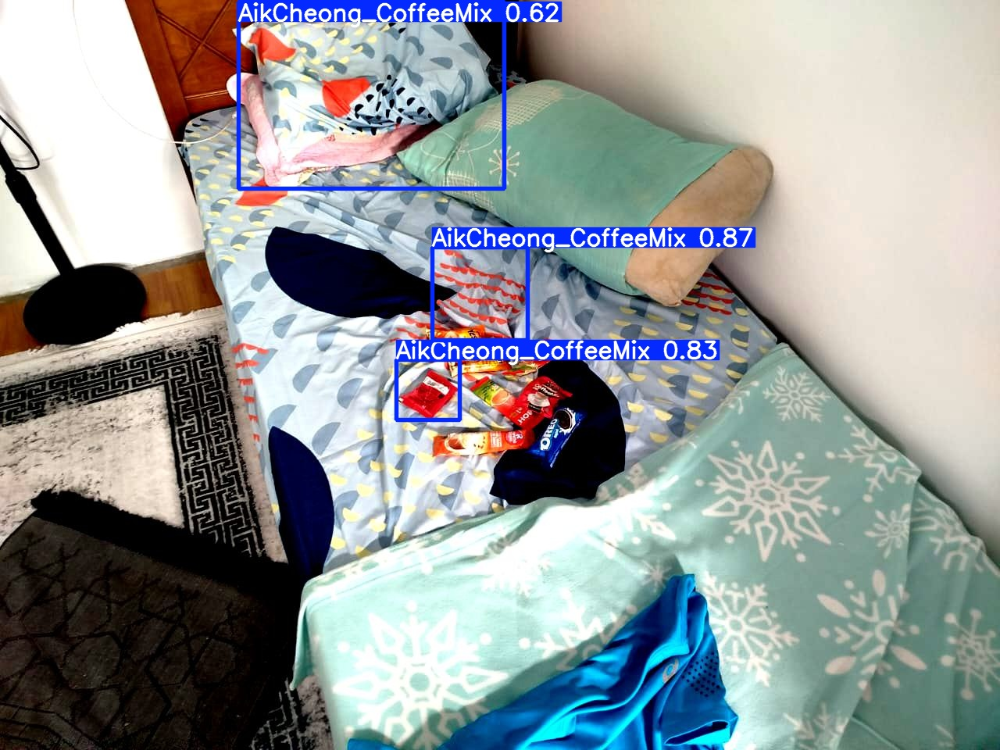

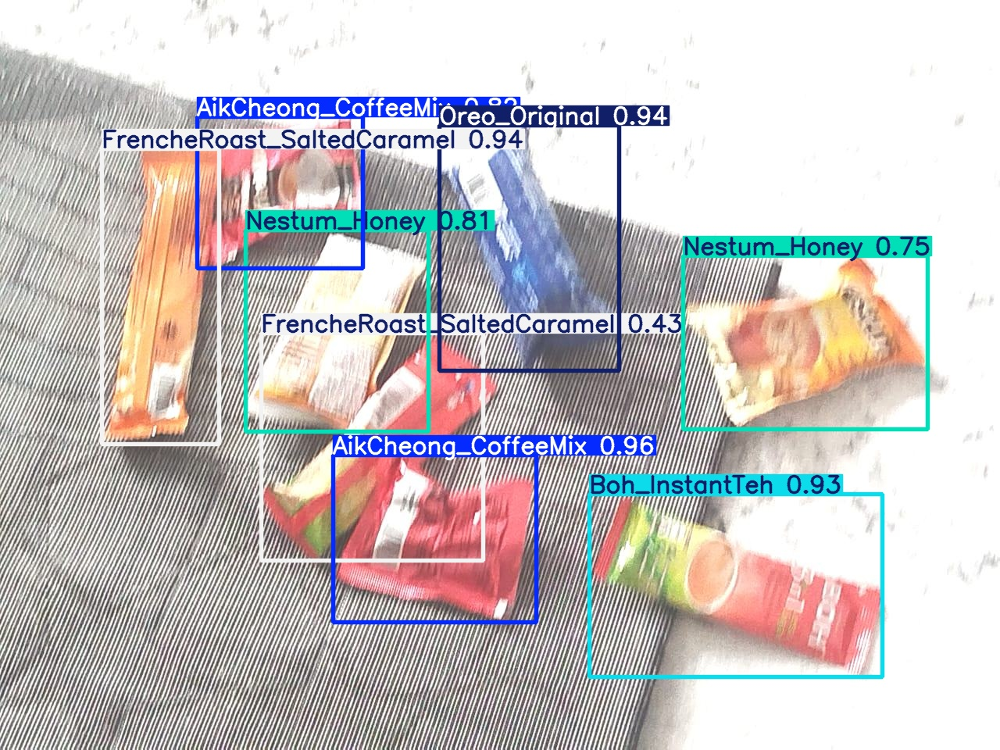

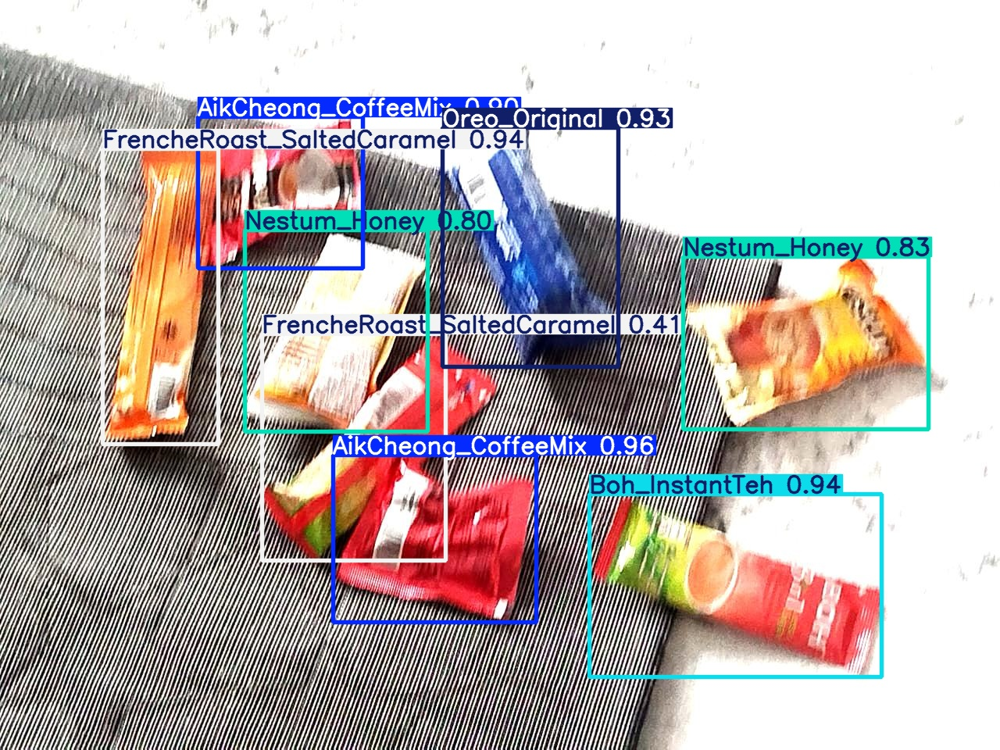

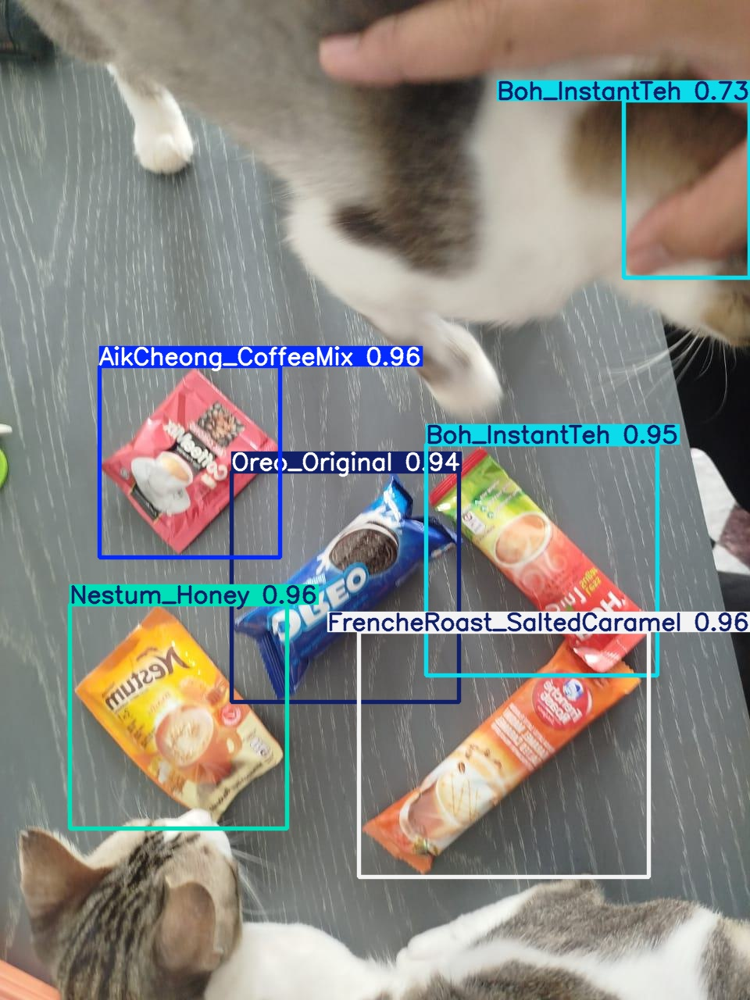

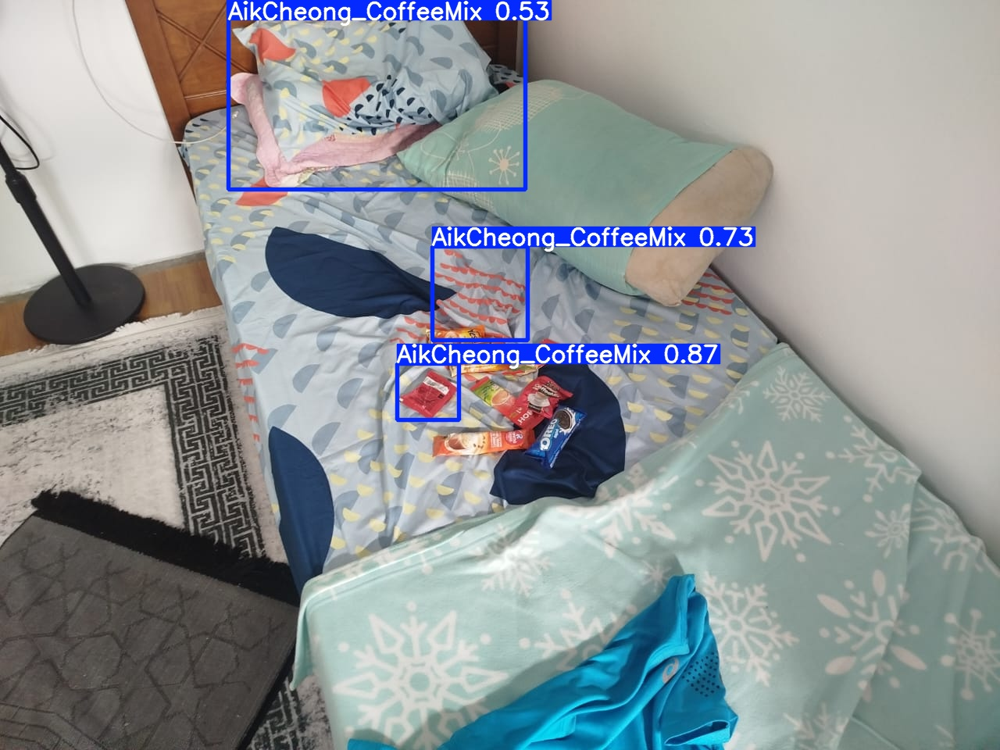

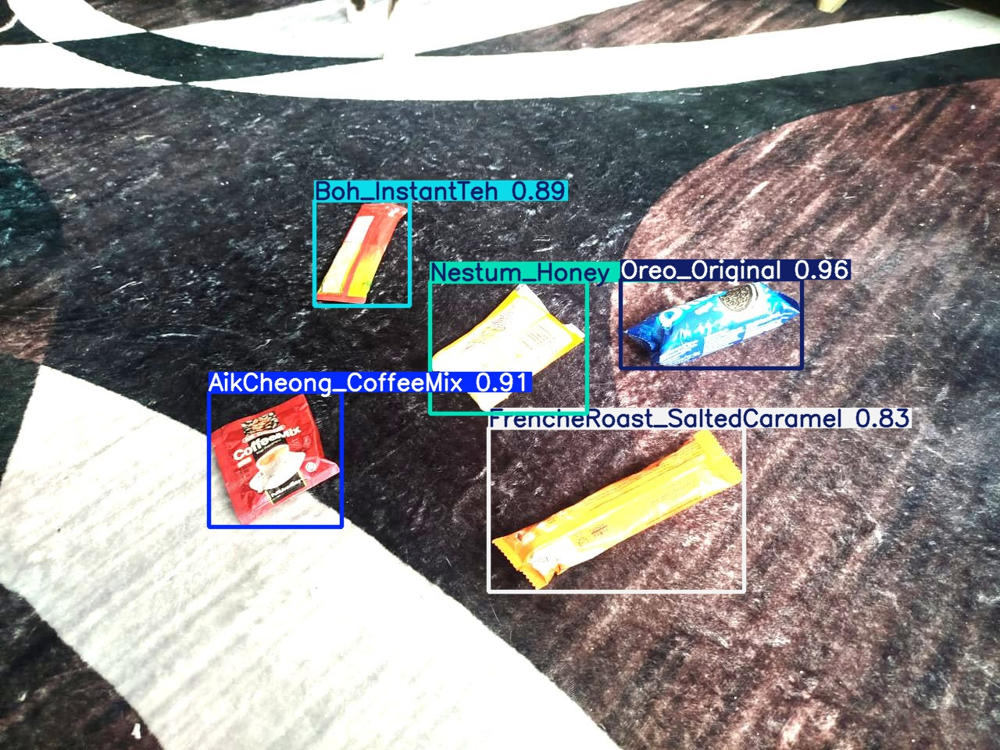

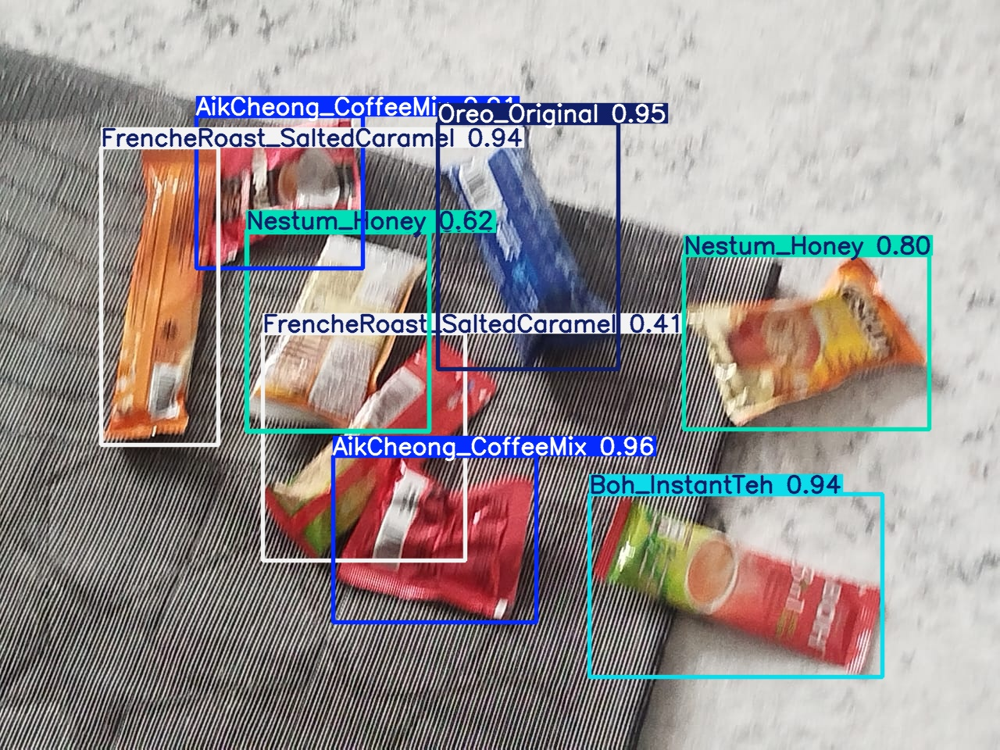

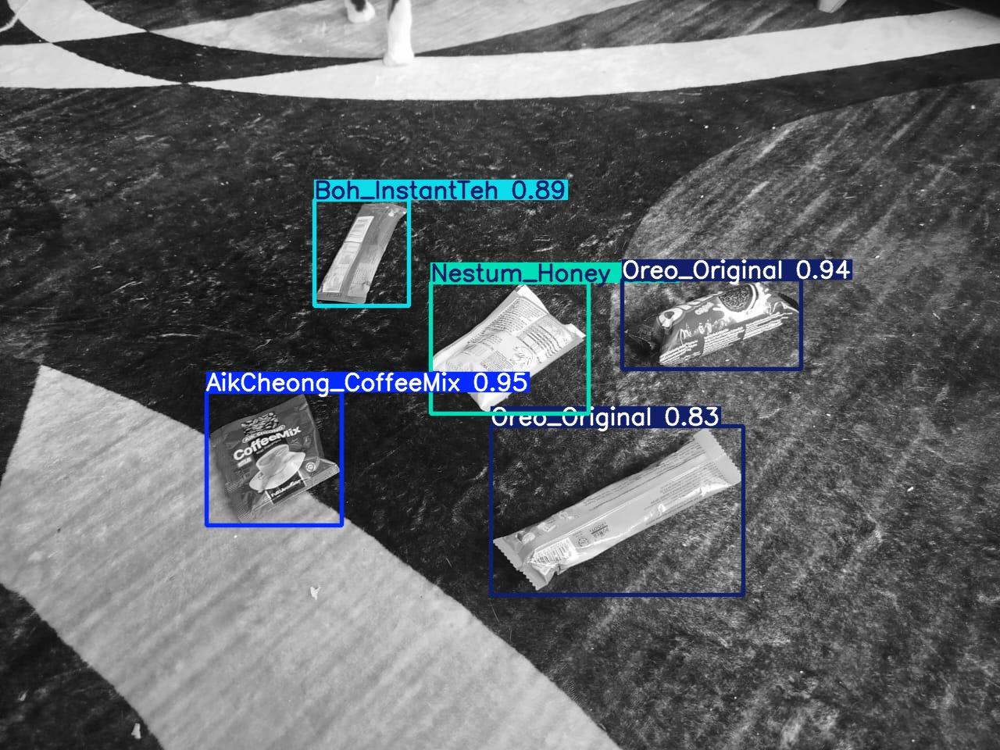

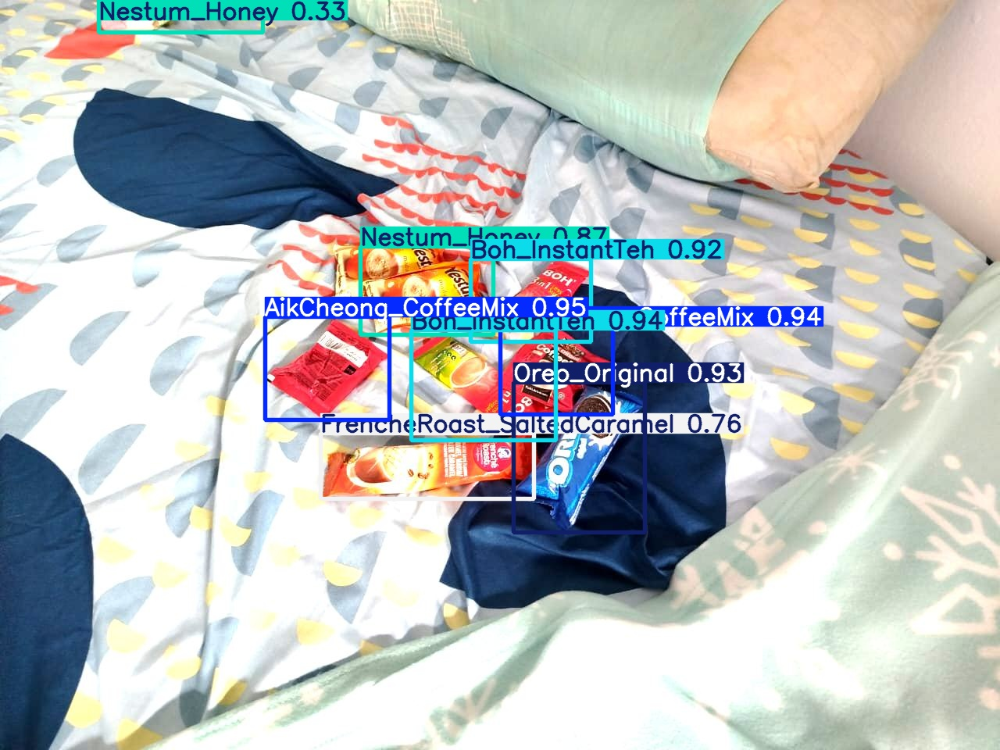

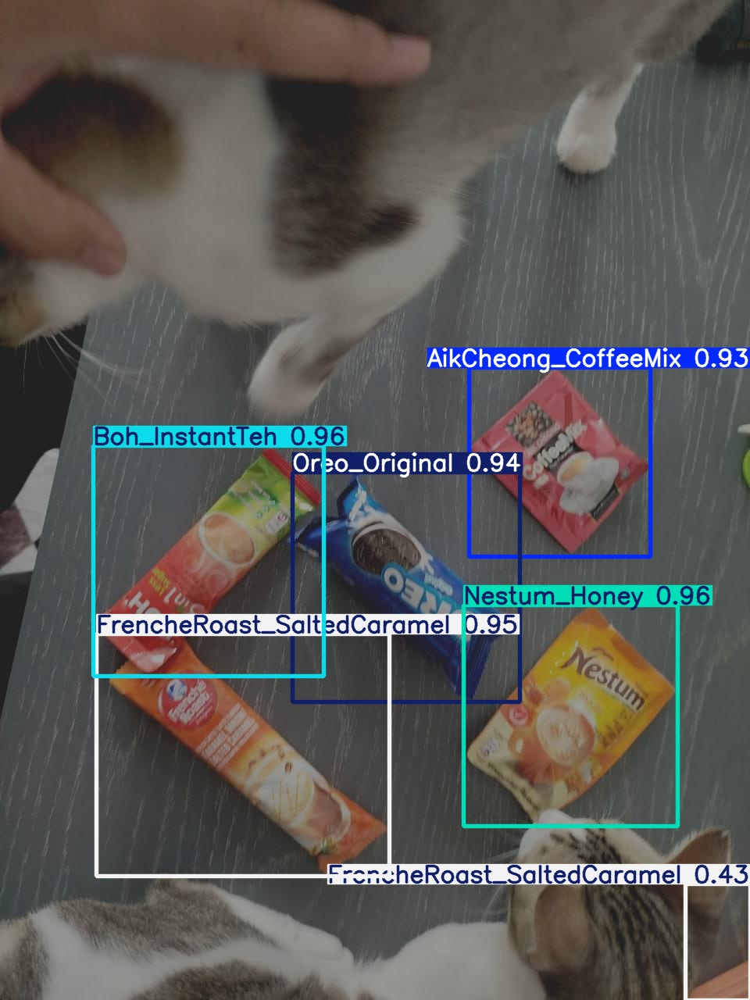

In [21]:
print("Sample predictions from the test set:")
for image_path in glob.glob(f'/content/runs/detect/predict_test/*.jpg')[:10]:
  display(Image(filename=image_path, height=400))
  print('\n')

In [22]:
# Evaluate the model on the test dataset
metrics_test = model.val(data="/content/data/data.yaml", split='test')

# Print the metrics
print(f"\nPrecision: {metrics_test.box.p}")
print(f"Recall: {metrics_test.box.r}")
print(f"mAP50: {metrics_test.box.map50}")
print(f"mAP50-95: {metrics_test.box.map}")

Ultralytics 8.4.75 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1259.7±158.2 MB/s, size: 168.1 KB)
val: Scanning /content/data/test/labels... 40 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 40/40 615.7it/s 0.1s
val: New cache created: /content/data/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.1s/it 3.2s
                   all         40        267      0.903      0.768      0.856      0.722
   AikCheong_CoffeeMix         40         63      0.882      0.857      0.922      0.791
        Boh_InstantTeh         40         63          1      0.635      0.786       0.66
FrencheRoast_SaltedCaramel         40         40      0.912       0.85      0.933      0.794
          Nestum_Honey         39         61      0.773      0.672      0.678      0.572
         Oreo_Original         40         40      0.945      0.825      0.959      

/tmp/ipykernel_2219/3908866407.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Metric', y='Value', data=df_metrics, palette='viridis', ax=ax)


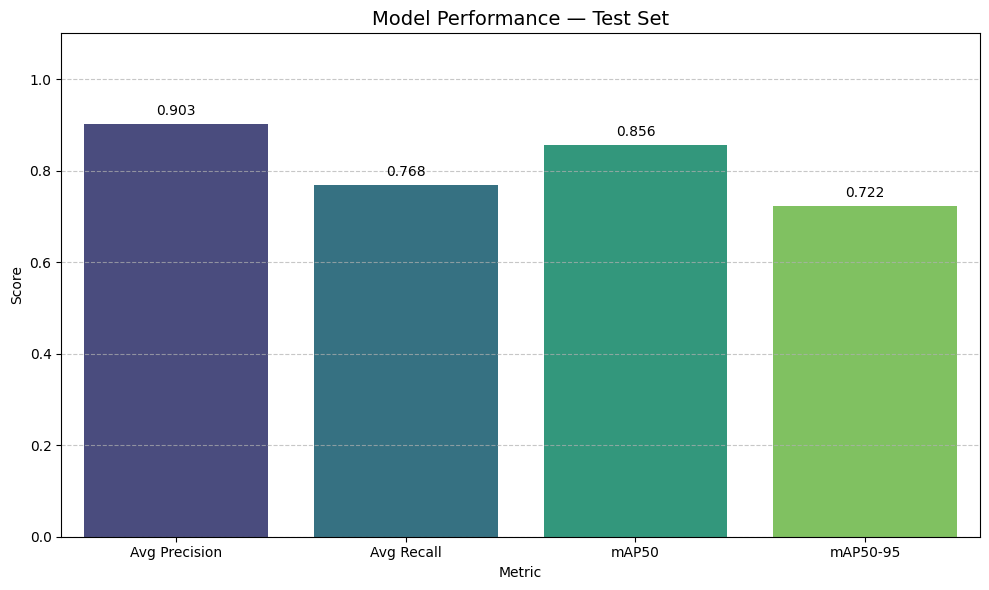

In [23]:
# Plot Box Chart

avg_precision = metrics_test.box.p.mean()
avg_recall    = metrics_test.box.r.mean()

metrics_data = {
    'Metric': ['Avg Precision', 'Avg Recall', 'mAP50', 'mAP50-95'],
    'Value':  [avg_precision, avg_recall, metrics_test.box.map50, metrics_test.box.map],
}
df_metrics = pd.DataFrame(metrics_data)

fig, ax = plt.subplots(figsize=(10, 6))
sns.barplot(x='Metric', y='Value', data=df_metrics, palette='viridis', ax=ax)
ax.set_title('Model Performance — Test Set', fontsize=14)
ax.set_ylabel('Score')
ax.set_ylim(0, 1.1)
for i, row in df_metrics.iterrows():
    ax.text(i, row['Value'] + 0.02, f"{row['Value']:.3f}", ha='center')
ax.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

## 6. Video Inference

Run the trained model on a recorded video. Detected objects will be annotated with bounding boxes and the output video will be saved to `/content/runs/detect/predict_video/`.

In [24]:
# Run prediction on video
!yolo detect predict model=runs/detect/train/weights/best.pt source=/content/video_2026-06-22_12-10-08.mp4 save=True name=predict_video

Ultralytics 8.4.75 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO26s summary (fused): 122 layers, 9,467,115 parameters, 0 gradients, 20.5 GFLOPs

video 1/1 (frame 1/1147) /content/video_2026-06-22_12-10-08.mp4: 384x640 (no detections), 57.4ms
video 1/1 (frame 2/1147) /content/video_2026-06-22_12-10-08.mp4: 384x640 (no detections), 11.3ms
video 1/1 (frame 3/1147) /content/video_2026-06-22_12-10-08.mp4: 384x640 (no detections), 15.4ms
video 1/1 (frame 4/1147) /content/video_2026-06-22_12-10-08.mp4: 384x640 (no detections), 11.3ms
video 1/1 (frame 5/1147) /content/video_2026-06-22_12-10-08.mp4: 384x640 (no detections), 11.3ms
video 1/1 (frame 6/1147) /content/video_2026-06-22_12-10-08.mp4: 384x640 (no detections), 18.5ms
video 1/1 (frame 7/1147) /content/video_2026-06-22_12-10-08.mp4: 384x640 (no detections), 14.7ms
video 1/1 (frame 8/1147) /content/video_2026-06-22_12-10-08.mp4: 384x640 (no detections), 11.8ms
video 1/1 (frame 9/1147) /content/video_2026-06-22_12-10